In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import glob
from google.colab import drive
import glob
import obspy  # To handle `.mseed` files
import numpy as np
import polars as pl
from obspy import read
import seaborn as sns


In [ ]:
!pip install obspy




   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.5/14.5 MB 79.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 48.8 MB/s eta 0:00:00
  Attempting uninstall: sqlalchemy
    Found existing installation: SQLAlchemy 2.0.36
    Uninstalling SQLAlchemy-2.0.36:
      Successfully uninstalled SQLAlchemy-2.0.36
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
ipython-sql 0.5.0 requires sqlalchemy>=2.0, but you have sqlalchemy 1.4.54 which is incompatible.


In [ ]:
!pip install scikeras


In [ ]:

# Step 1: Mount Google Drive
drive.mount('/content/drive')



Mounted at /content/drive


In [ ]:


# Load the CSV file
catalog = pd.read_csv('/content/drive/MyDrive/space_apps_2024_seismic_detection/space_apps_2024_seismic_detection/data/lunar/training/catalogs/apollo12_catalog_GradeA_final.csv')

# Display the first few rows
print(catalog.head())


                                 filename time_abs(%Y-%m-%dT%H:%M:%S.%f)  \
0  xa.s12.00.mhz.1970-01-19HR00_evid00002     1970-01-19T20:25:00.000000   
1  xa.s12.00.mhz.1970-03-25HR00_evid00003     1970-03-25T03:32:00.000000   
2  xa.s12.00.mhz.1970-03-26HR00_evid00004     1970-03-26T20:17:00.000000   
3  xa.s12.00.mhz.1970-04-25HR00_evid00006     1970-04-25T01:14:00.000000   
4  xa.s12.00.mhz.1970-04-26HR00_evid00007     1970-04-26T14:29:00.000000   

   time_rel(sec)       evid    mq_type  
0        73500.0  evid00002  impact_mq  
1        12720.0  evid00003  impact_mq  
2        73020.0  evid00004  impact_mq  
3         4440.0  evid00006  impact_mq  
4        52140.0  evid00007    deep_mq  


In [ ]:
import os
import pandas as pd

# Define the directory containing the MiniSEED files
dir = '/content/drive/MyDrive/space_apps_2024_seismic_detection/space_apps_2024_seismic_detection/data/lunar/training/data/S12_GradeA'

# Get a list of all .mseed files in the directory (remove .mseed extension for matching)
mseed_files = [os.path.splitext(f)[0] for f in os.listdir(dir) if f.endswith('.mseed')]

# Load the CSV catalog
catalog = pd.read_csv('/content/drive/MyDrive/space_apps_2024_seismic_detection/space_apps_2024_seismic_detection/data/lunar/training/catalogs/apollo12_catalog_GradeA_final.csv')

# Ensure the file column in the catalog contains the filenames (adjust column name as needed)
if 'filename' in catalog.columns:
    catalog['file'] = catalog['filename'].apply(lambda x: x.split('/')[-1])
else:
    raise ValueError("Column 'file_column_name' not found in catalog.")

# Remove `.mseed` from catalog filenames to ensure matching
catalog['file'] = catalog['file'].str.replace('.mseed', '', regex=False)

# Debugging: Print filenames
print("Catalog Files (Processed):", catalog['file'].unique())
print("MiniSEED Files (Processed):", mseed_files)

# Filter catalog to match files found in the directory
filtered_catalog = catalog[catalog['file'].isin(mseed_files)]

# Debugging: Check if filtered catalog is empty
if filtered_catalog.empty:
    print("No matching files found between catalog and directory. Check filename formatting.")
else:
    print("Filtered Catalog:")
    print(filtered_catalog)


Catalog Files (Processed): ['xa.s12.00.mhz.1970-01-19HR00_evid00002'
 'xa.s12.00.mhz.1970-03-25HR00_evid00003'
 'xa.s12.00.mhz.1970-03-26HR00_evid00004'
 'xa.s12.00.mhz.1970-04-25HR00_evid00006'
 'xa.s12.00.mhz.1970-04-26HR00_evid00007'
 'xa.s12.00.mhz.1970-06-15HR00_evid00008'
 'xa.s12.00.mhz.1970-06-26HR00_evid00009'
 'xa.s12.00.mhz.1970-07-20HR00_evid00010'
 'xa.s12.00.mhz.1970-07-20HR00_evid00011'
 'xa.s12.00.mhz.1970-09-26HR00_evid00013'
 'xa.s12.00.mhz.1970-10-24HR00_evid00014'
 'xa.s12.00.mhz.1970-11-12HR00_evid00015'
 'xa.s12.00.mhz.1970-12-11HR00_evid00017'
 'xa.s12.00.mhz.1970-12-27HR00_evid00019'
 'xa.s12.00.mhz.1970-12-31HR00_evid00021'
 'xa.s12.00.mhz.1971-01-15HR00_evid00022'
 'xa.s12.00.mhz.1971-01-28HR00_evid00023'
 'xa.s12.00.mhz.1971-01-29HR00_evid00024'
 'xa.s12.00.mhz.1971-02-09HR00_evid00026'
 'xa.s12.00.mhz.1971-03-25HR00_evid00028'
 'xa.s12.00.mhz.1971-04-13HR00_evid00029'
 'xa.s12.00.mhz.1971-04-17HR00_evid00030'
 'xa.s12.00.mhz.1971-05-12HR00_evid00031'
 'xa.s1

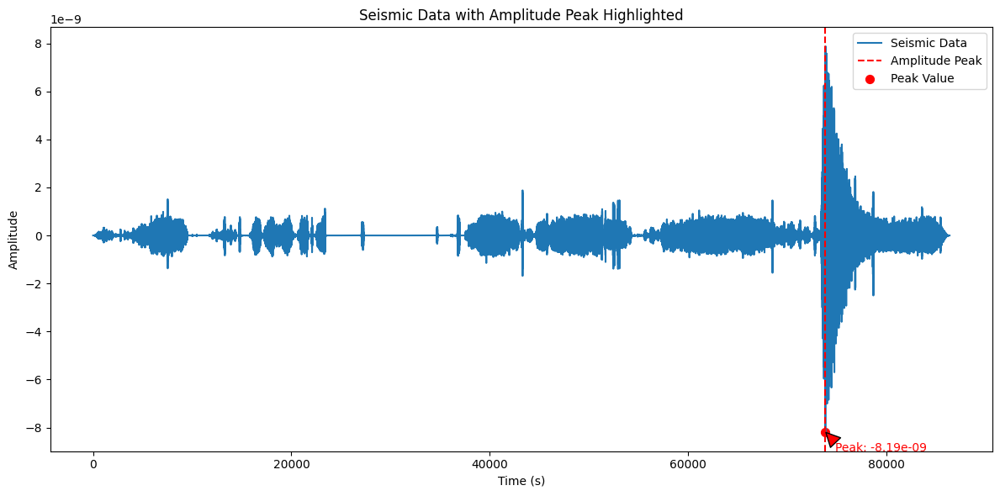

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import obspy

# Load the seismic data
file_path = "/content/drive/MyDrive/space_apps_2024_seismic_detection/space_apps_2024_seismic_detection/data/lunar/training/data/S12_GradeA/xa.s12.00.mhz.1970-01-19HR00_evid00002.mseed"
stream = obspy.read(file_path)
trace = stream[0]

# Sampling rate and time vector
sampling_rate = trace.stats.sampling_rate
time = np.linspace(0, len(trace.data) / sampling_rate, num=len(trace.data))

# Find the peak amplitude and its corresponding time
peak_index = np.argmax(np.abs(trace.data))  # Index of the highest amplitude
peak_time = time[peak_index]  # Time of the highest amplitude
peak_value = trace.data[peak_index]  # Value of the highest amplitude

# Plot the seismic data and highlight the peak
plt.figure(figsize=(12, 6))

# Plot seismic trace
plt.plot(time, trace.data, label="Seismic Data")
plt.axvline(x=peak_time, color='red', linestyle='--', label="Amplitude Peak")
plt.scatter(peak_time, peak_value, color='red', s=50, label="Peak Value")
plt.title("Seismic Data with Amplitude Peak Highlighted")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.legend(loc="upper right")

# Annotate the peak value
plt.annotate(f"Peak: {peak_value:.2e}", xy=(peak_time, peak_value),
             xytext=(peak_time + 1000, peak_value + peak_value * 0.1),
             arrowprops=dict(facecolor='red', shrink=0.05),
             fontsize=10, color="red")

# Show plot
plt.tight_layout()
plt.show()


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import spectrogram
import pandas as pd

# Load the seismic data from the CSV file
file_path = "/mnt/data/xa.s12.00.mhz.1975-06-26HR00_evid00198.csv"
df = pd.read_csv(file_path)

# Extract the relevant columns
time = df['time_rel(sec)'].values
amplitude = df['velocity(m/s)'].values  # Using 'velocity(m/s)' as the amplitude data

# Find the sampling rate
sampling_rate = 1 / np.mean(np.diff(time))

# Find the peak amplitude
peak_index = np.argmax(np.abs(amplitude))  # Index of the highest amplitude
peak_time = time[peak_index]  # Time of the highest amplitude
peak_value = amplitude[peak_index]  # Value of the highest amplitude

# Generate the spectrogram
frequencies, times, Sxx = spectrogram(amplitude, fs=sampling_rate, nperseg=1024)

# Convert times to formatted day/hour:minute
formatted_times = [pd.to_datetime('1975-06-26') + pd.to_timedelta(t, unit='s') for t in times]

# Plot the spectrogram with peak detection
plt.figure(figsize=(12, 6))

plt.pcolormesh(times, frequencies, 10 * np.log10(Sxx), shading='gouraud', cmap='viridis')
plt.colorbar(label="Power ((m/s)^2/sqrt(Hz))")
plt.axvline(x=peak_time, color='red', linestyle='-', label="Peak Detected")
plt.title("Spectrogram with Peak Detection")
plt.ylabel("Frequency (Hz)")
plt.xlabel("Time (Day Hour:Minute)")
plt.xticks(ticks=times[::len(times)//6], labels=[t.strftime('%m-%d %H:%M') for t in formatted_times[::len(times)//6]])
plt.legend(loc="upper right")

# Highlight the peak in the spectrogram
plt.tight_layout()
plt.show()


FileNotFoundError: [Errno 2] No such file or directory: '/mnt/data/xa.s12.00.mhz.1975-06-26HR00_evid00198.csv'

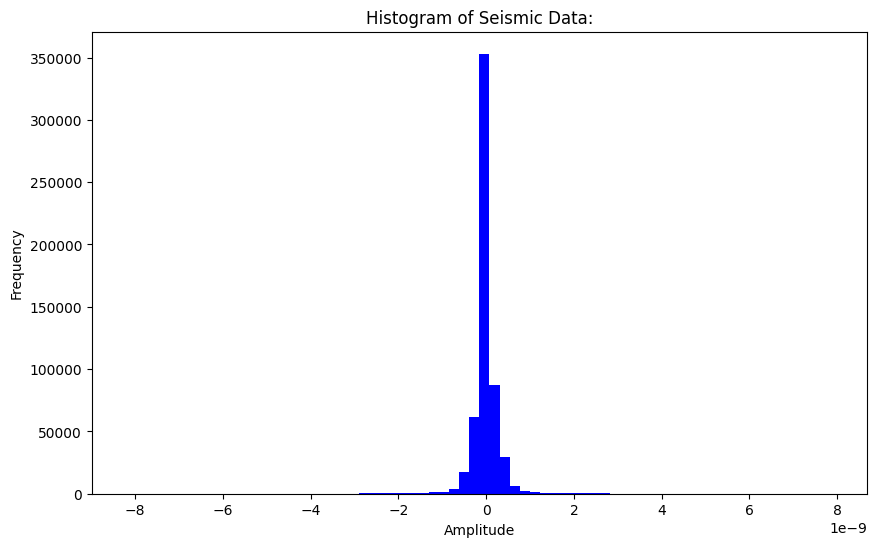

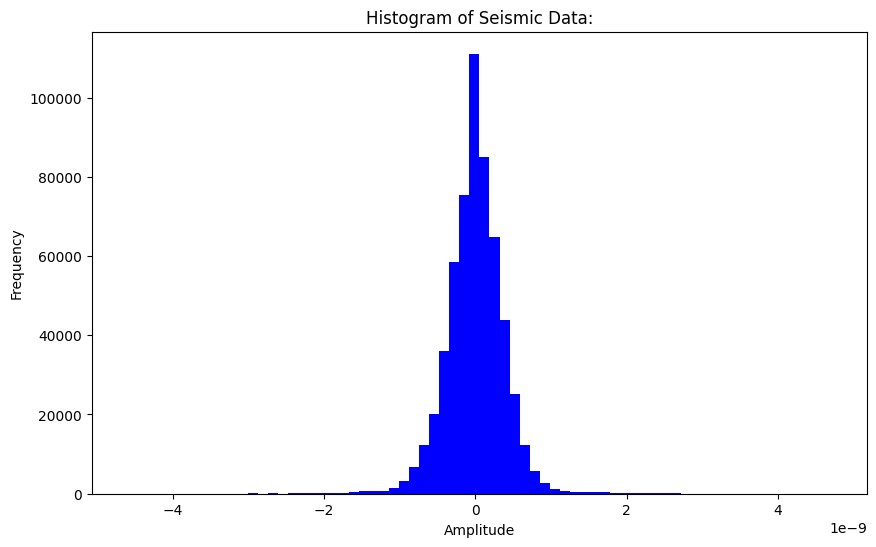

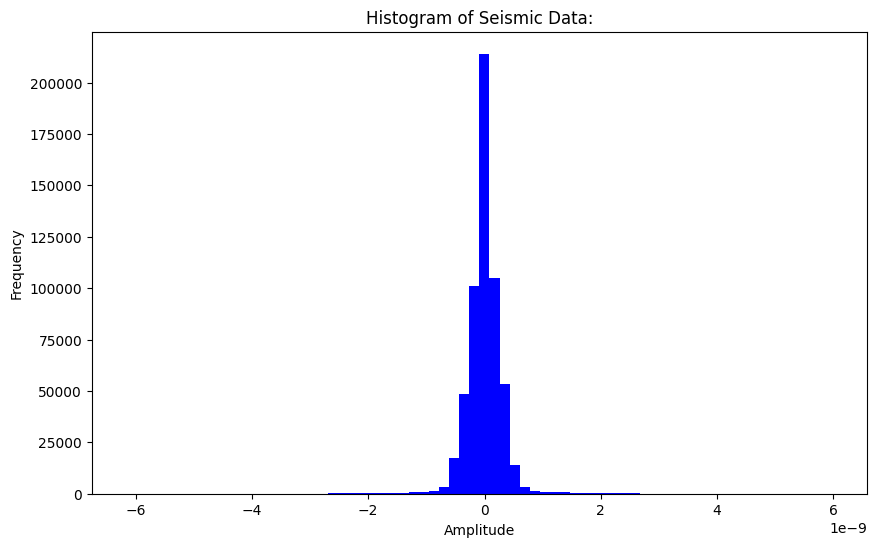

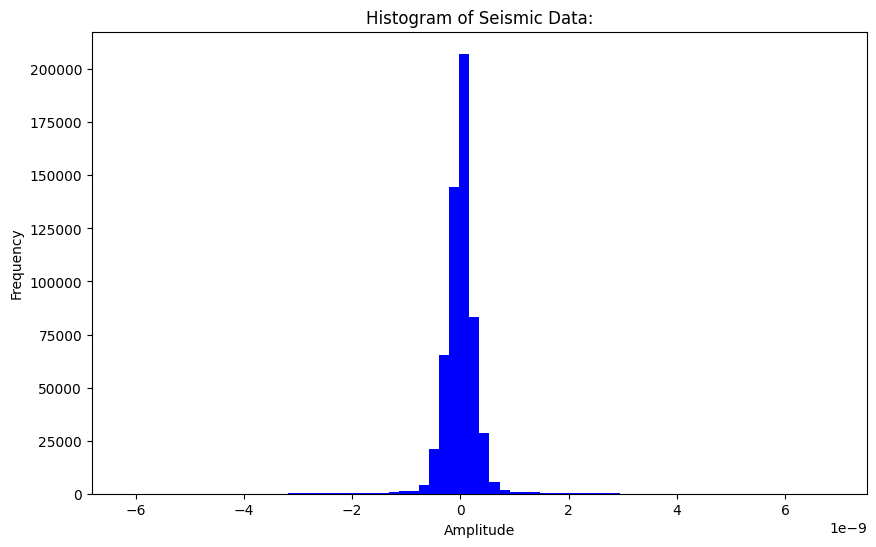

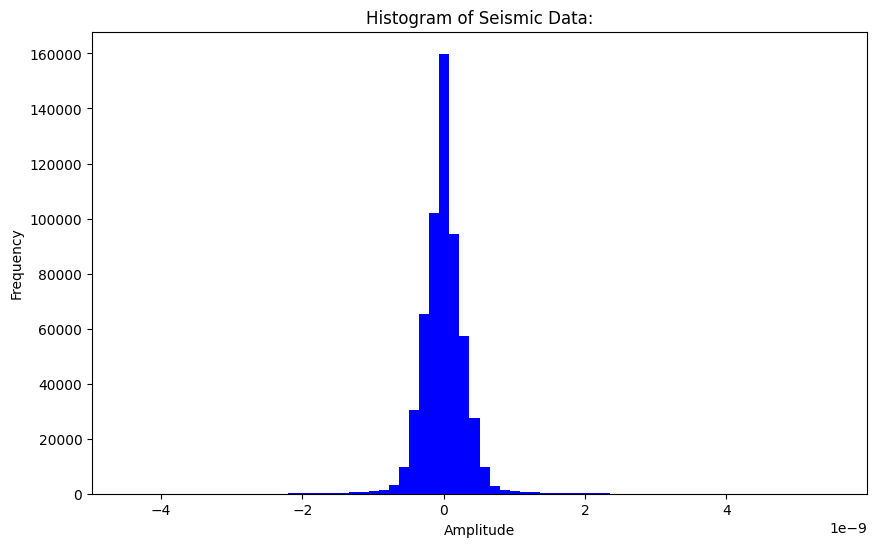

...

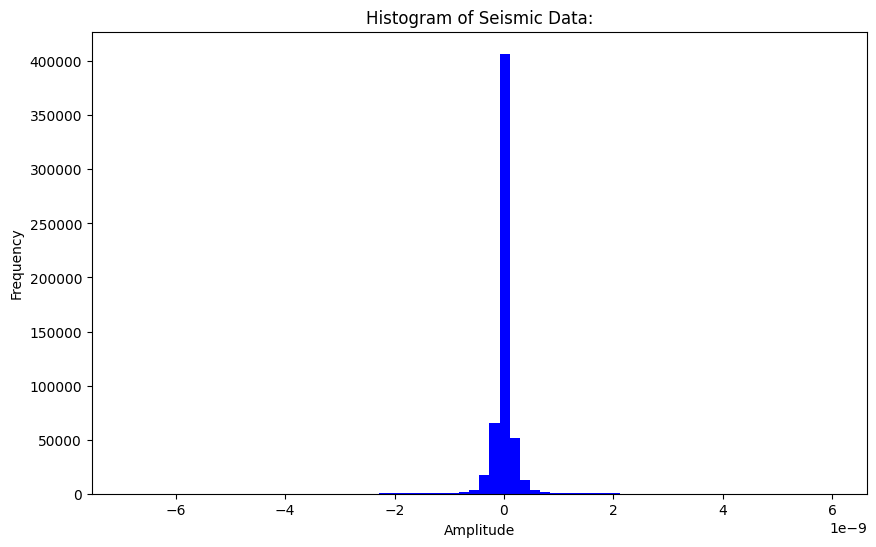

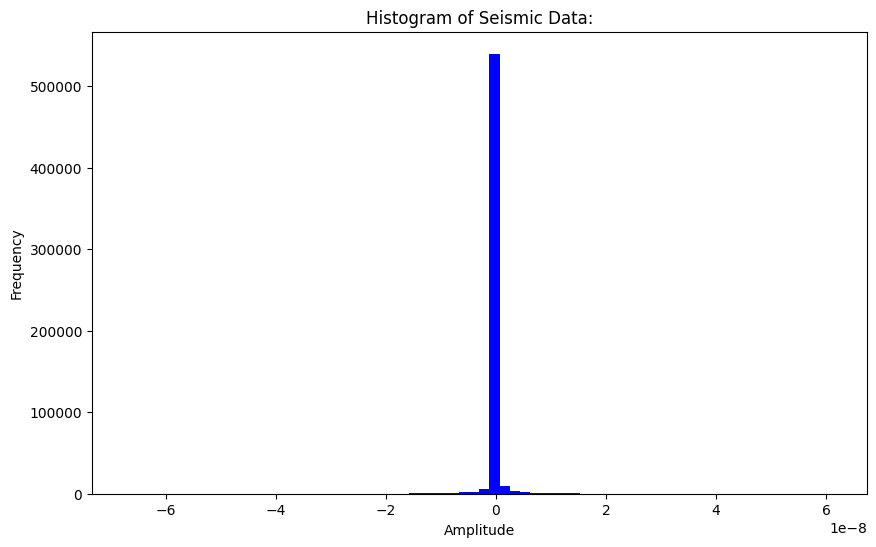

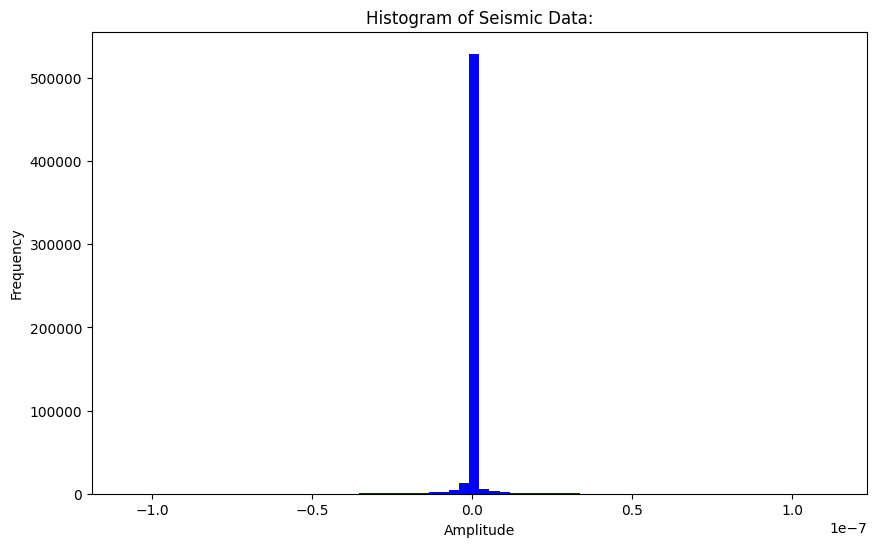

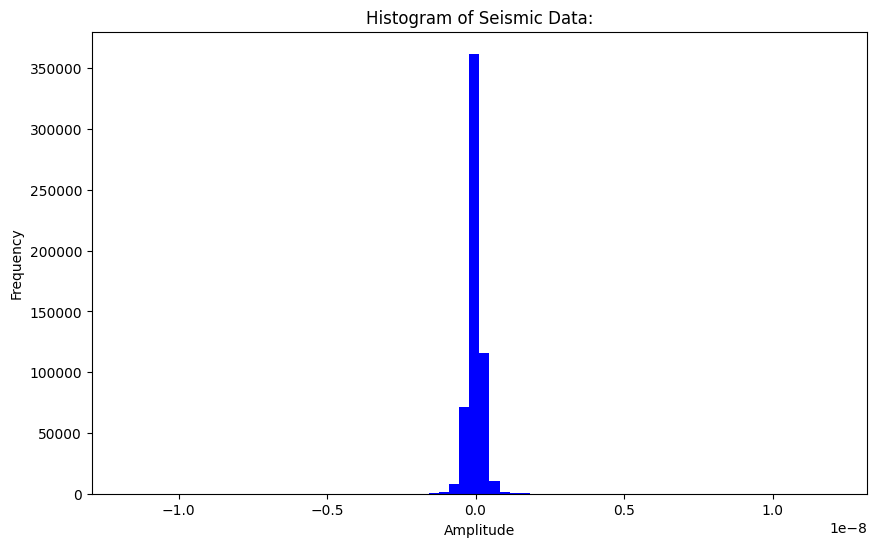

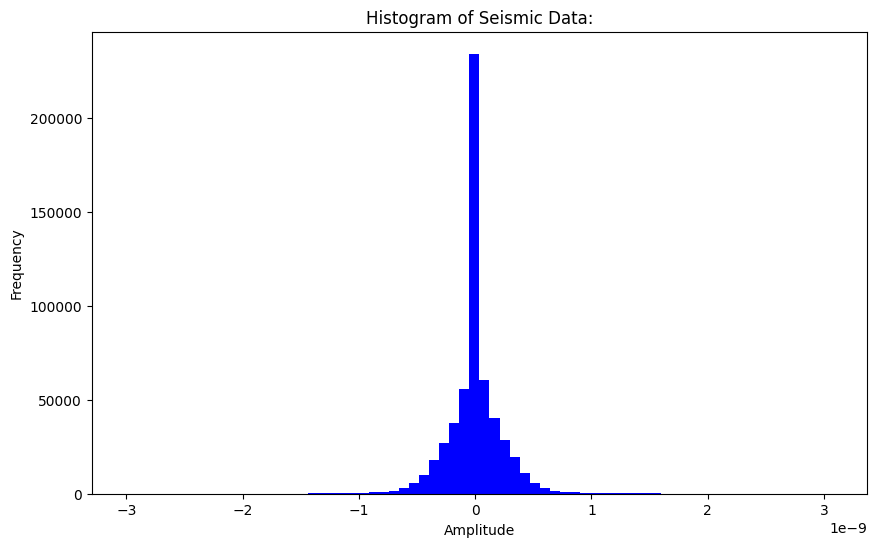

In [ ]:

folder_path = '/content/drive/MyDrive/space_apps_2024_seismic_detection/space_apps_2024_seismic_detection/data/lunar/training/data/S12_GradeA/'

csv_files = glob.glob(folder_path + '*.csv')
mseed_files = glob.glob(folder_path + '*.mseed')
csv_files = sorted(csv_files)
mseed_files = sorted(mseed_files)

# Read the CSV file (you can remove this if you don't need to use the CSV file anymore)
df_csv = pd.read_csv("/content/drive/MyDrive/space_apps_2024_seismic_detection/space_apps_2024_seismic_detection/data/lunar/training/data/S12_GradeA/xa.s12.00.mhz.1970-03-25HR00_evid00003.csv")

# Iterate through each .mseed file
for file in mseed_files:
    stream = obspy.read(file)

    amplitudes = []
    for trace in stream:
        amplitudes.extend(trace.data)

    plt.figure(figsize=(10, 6))
    plt.hist(amplitudes, bins=70, color='blue')

    # Set the title and labels for the plot
    plt.title(f"Histogram of Seismic Data:")
    plt.xlabel('Amplitude')
    plt.ylabel('Frequency')

    # Show the plot
    plt.show()

In [ ]:
# Create a pandas DataFrame from the list of file paths
mseed_files = pd.DataFrame(mseed_files, columns=['File Path'])
# Display the DataFrame
print(type(mseed_files))

<class 'pandas.core.frame.DataFrame'>


In [ ]:
csv_files = pd.DataFrame(csv_files, columns=['File Path'])
# Display the DataFrame
print(type(csv_files))

<class 'pandas.core.frame.DataFrame'>


In [ ]:
stats = df_csv['velocity(m/s)'].describe()
print(f"Descriptive Statistics for {file}:\n", stats)
print("Range:", df_csv['velocity(m/s)'].max() - df_csv['velocity(m/s)'].min())


Descriptive Statistics for /content/drive/MyDrive/space_apps_2024_seismic_detection/space_apps_2024_seismic_detection/data/lunar/training/data/S12_GradeA/xa.s12.00.mhz.1975-06-26HR00_evid00198.mseed:
 count    5.724110e+05
mean    -1.939339e-12
std      3.865140e-10
min     -4.603228e-09
25%     -2.115210e-10
50%      1.764188e-12
75%      2.144111e-10
max      4.707866e-09
Name: velocity(m/s), dtype: float64
Range: 9.311094910414378e-09


In [ ]:
for tr in stream:
    print(f"Trace Stats for {file} - ID: {tr.id}")
    print(f"Mean Amplitude: {tr.data.mean()}")
    print(f"Standard Deviation: {tr.data.std()}")
    print(f"Max Amplitude: {tr.data.max()}")
    print(f"Min Amplitude: {tr.data.min()}")
    print(f"Trace Duration (s): {tr.stats.npts / tr.stats.sampling_rate}")


Trace Stats for /content/drive/MyDrive/space_apps_2024_seismic_detection/space_apps_2024_seismic_detection/data/lunar/training/data/S12_GradeA/xa.s12.00.mhz.1975-06-26HR00_evid00198.mseed - ID: XA.S12.00.MHZ
Mean Amplitude: -1.3758590812829771e-13
Standard Deviation: 2.4484028043109387e-10
Max Amplitude: 3.066067394358325e-09
Min Amplitude: -2.9928790630241306e-09
Trace Duration (s): 86401.05660377358


In [ ]:
print(df_csv.columns)

print(df_csv)


Index(['time_abs(%Y-%m-%dT%H:%M:%S.%f)', 'time_rel(sec)', 'velocity(m/s)'], dtype='object')
       time_abs(%Y-%m-%dT%H:%M:%S.%f)  time_rel(sec)  velocity(m/s)
0          1970-03-25T00:00:00.440000       0.000000  -5.481780e-15
1          1970-03-25T00:00:00.590943       0.150943  -6.878653e-15
2          1970-03-25T00:00:00.741887       0.301887  -7.486137e-15
3          1970-03-25T00:00:00.892830       0.452830  -7.191481e-15
4          1970-03-25T00:00:01.043774       0.603774  -6.287278e-15
...                               ...            ...            ...
572406     1970-03-26T00:00:01.345660   86400.905660   8.188906e-16
572407     1970-03-26T00:00:01.496604   86401.056604  -6.852630e-17
572408     1970-03-26T00:00:01.647547   86401.207547  -8.490759e-16
572409     1970-03-26T00:00:01.798491   86401.358491  -1.930016e-15
572410     1970-03-26T00:00:01.949434   86401.509434  -3.466622e-15

[572411 rows x 3 columns]


In [ ]:
cat = pd.read_csv(
    "/content/drive/MyDrive/space_apps_2024_seismic_detection/space_apps_2024_seismic_detection/data/lunar/training/catalogs/apollo12_catalog_GradeA_final.csv"
)
cat

,filename,time_abs(%Y-%m-%dT%H:%M:%S.%f),time_rel(sec),evid,mq_type
0,xa.s12.00.mhz.1970-01-19HR00_evid00002,1970-01-19T20:25:00.000000,73500.0,evid00002,impact_mq
1,xa.s12.00.mhz.1970-03-25HR00_evid00003,1970-03-25T03:32:00.000000,12720.0,evid00003,impact_mq
2,xa.s12.00.mhz.1970-03-26HR00_evid00004,1970-03-26T20:17:00.000000,73020.0,evid00004,impact_mq
3,xa.s12.00.mhz.1970-04-25HR00_evid00006,1970-04-25T01:14:00.000000,4440.0,evid00006,impact_mq
4,xa.s12.00.mhz.1970-04-26HR00_evid00007,1970-04-26T14:29:00.000000,52140.0,evid00007,deep_mq
...,...,...,...,...,...
71,xa.s12.00.mhz.1974-10-14HR00_evid00156,1974-10-14T17:43:00.000000,63780.0,evid00156,impact_mq
72,xa.s12.00.mhz.1975-04-12HR00_evid00191,1975-04-12T18:15:00.000000,65700.0,evid00191,impact_mq
73,xa.s12.00.mhz.1975-05-04HR00_evid00192,1975-05-04T10:05:00.000000,36300.0,evid00192,impact_mq
74,xa.s12.00.mhz.1975-06-24HR00_evid00196,1975-06-24T16:03:00.000000,57780.0,evid00196,impact_mq


<class 'pandas.core.frame.DataFrame'>


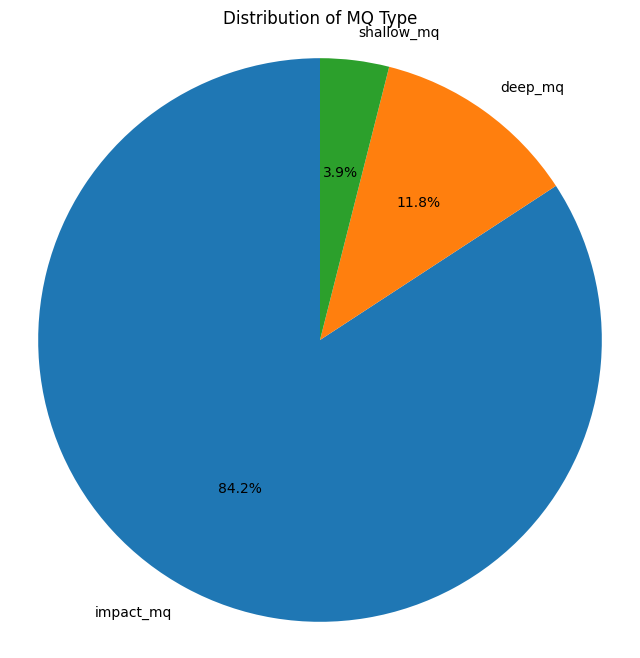

In [ ]:
import matplotlib.pyplot as plt
import polars as pl


# Extract the 'mq_type' column and get value counts
mq_counts = cat["mq_type"].value_counts()

# Plot the pie chart
plt.figure(figsize=(8, 8))
plt.pie(mq_counts, labels=mq_counts.index, autopct='%1.1f%%', startangle=90)
plt.title("Distribution of MQ Type")
plt.axis('equal')
plt.show()


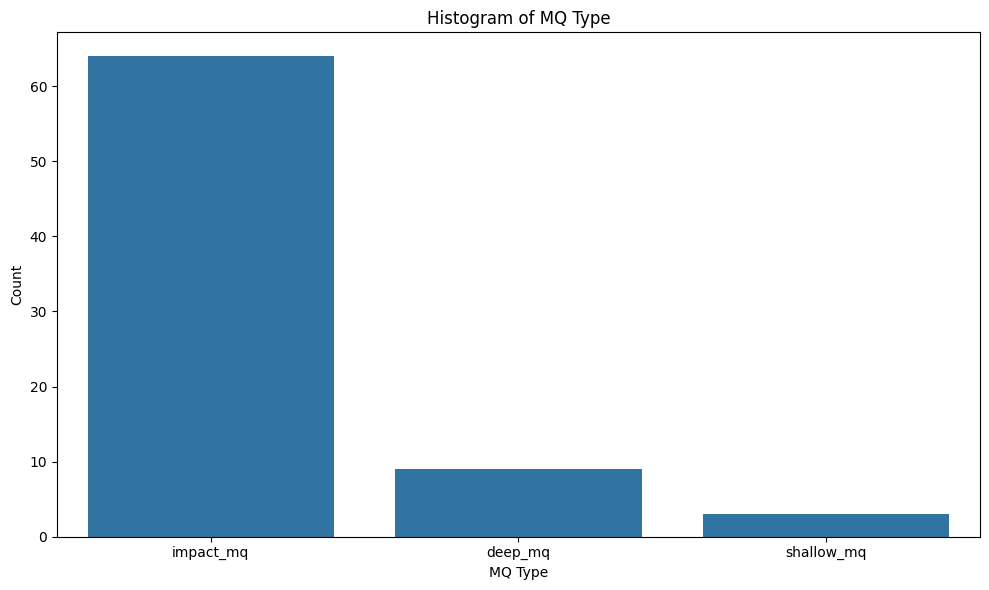

In [ ]:
# Create a histogram for 'mq_type'
plt.figure(figsize=(10, 6))
sns.countplot(x='mq_type', data=cat)

# Set plot title and labels
plt.title("Histogram of MQ Type")
plt.xlabel("MQ Type")
plt.ylabel("Count")

# Show the plot
plt.tight_layout()
plt.show()


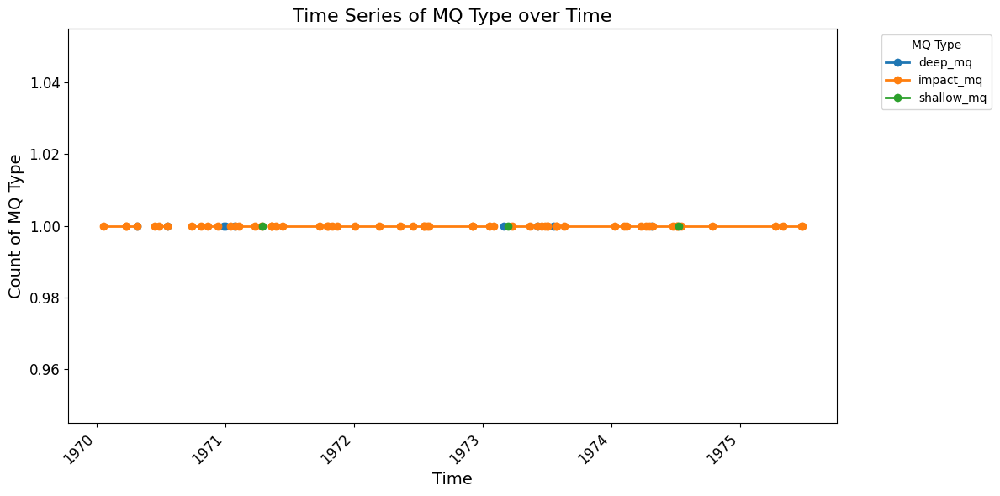

In [ ]:


# Ensure 'time_abs' is in datetime format
cat['time_abs(%Y-%m-%dT%H:%M:%S.%f)'] = pd.to_datetime(cat['time_abs(%Y-%m-%dT%H:%M:%S.%f)'])

# Plotting the time series for each mq_type
plt.figure(figsize=(12, 6))

# We will use groupby to count occurrences of each 'mq_type' per time
cat.groupby(['time_abs(%Y-%m-%dT%H:%M:%S.%f)', 'mq_type']).size().unstack().plot(kind='line', stacked=False, ax=plt.gca(), linewidth=2, marker='o')

# Set plot title and labels
plt.title("Time Series of MQ Type over Time", fontsize=16)
plt.xlabel("Time", fontsize=14)
plt.ylabel("Count of MQ Type", fontsize=14)
plt.legend(title="MQ Type", bbox_to_anchor=(1.05, 1), loc='upper left')

# Rotate x-axis labels for better readability
plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)

# Show the plot
plt.tight_layout()
plt.show()


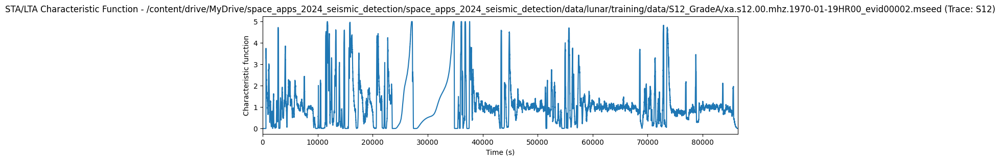

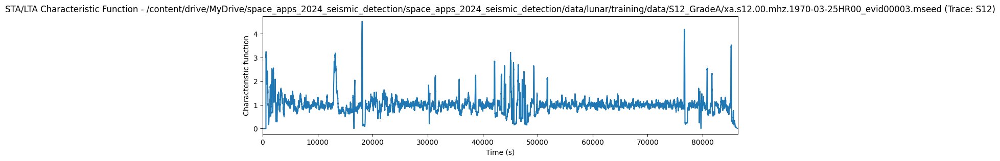

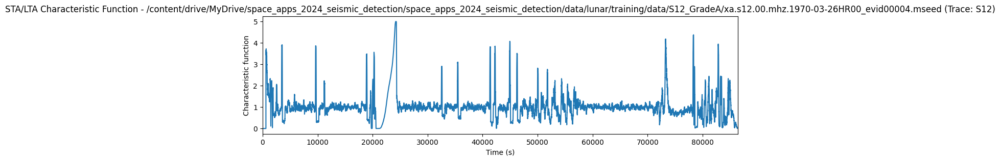

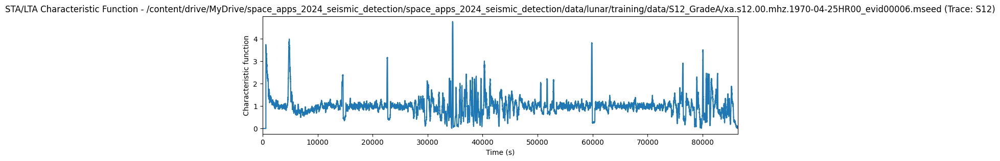

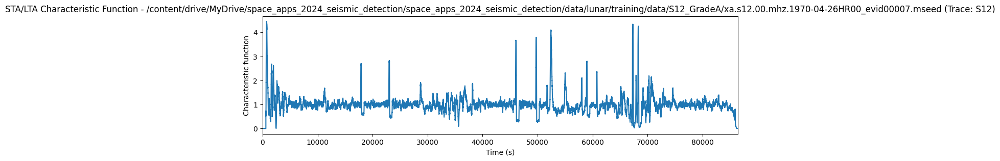

...

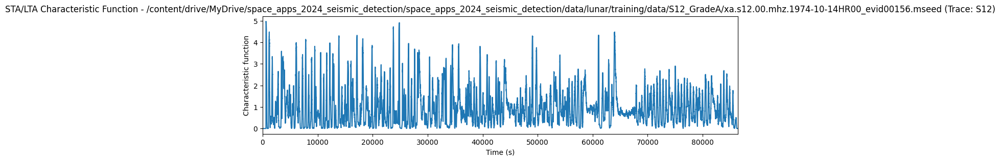

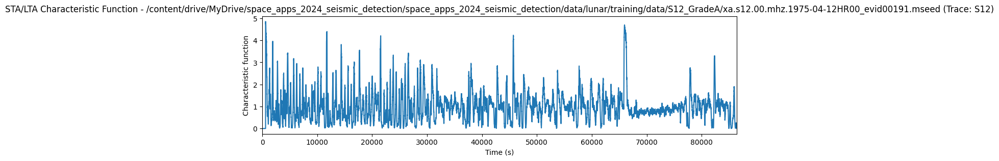

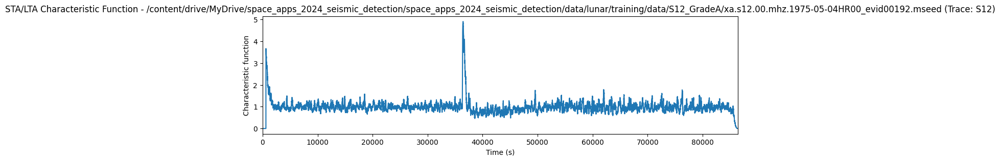

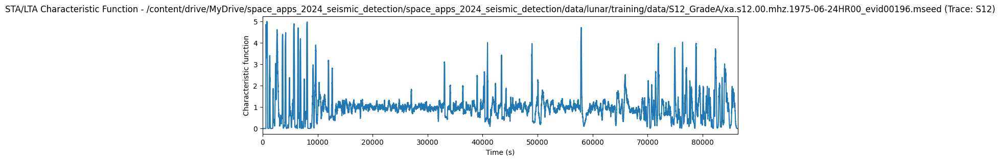

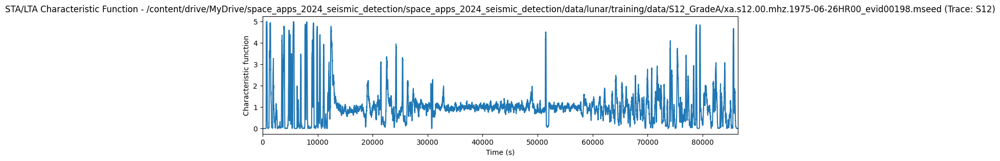

In [ ]:
import os

# Define the directory to save the plots
output_dir = "/content/sta_lta_plots"
os.makedirs(output_dir, exist_ok=True)  # Create the directory if it doesn't exist

# Load and process each .mseed file
for file in mseed_files:
    stream = obspy.read(file)  # Load the .mseed file as an ObsPy Stream object

    for tr in stream:
        # Sampling frequency of the trace
        df = tr.stats.sampling_rate

        # Define short-term and long-term window lengths (in seconds)
        sta_len = 120  # Short-term window length in seconds
        lta_len = 600  # Long-term window length in seconds

        # Extract the data from the trace
        tr_data = tr.data
        tr_times = tr.times()  # Get the time axis for plotting the characteristic function

        # Run ObsPy's STA/LTA to obtain a characteristic function
        cft = classic_sta_lta(tr_data, int(sta_len * df), int(lta_len * df))

        # Plot characteristic function
        fig, ax = plt.subplots(1, 1, figsize=(12, 3))
        ax.plot(tr_times, cft)
        ax.set_xlim([min(tr_times), max(tr_times)])
        ax.set_xlabel('Time (s)')
        ax.set_ylabel('Characteristic function')
        ax.set_title(f"STA/LTA Characteristic Function - {file} (Trace: {tr.stats.station})")
        plt.show()



In [ ]:
import shutil

# Path to the folder you want to download
folder_path = "/content/sta_lta_plots"
zip_file_path = "/content/sta_lta_plots.zip"

# Compress the folder into a zip file
shutil.make_archive(zip_file_path.replace('.zip', ''), 'zip', folder_path)

# Provide a download link
from google.colab import files
files.download(zip_file_path)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

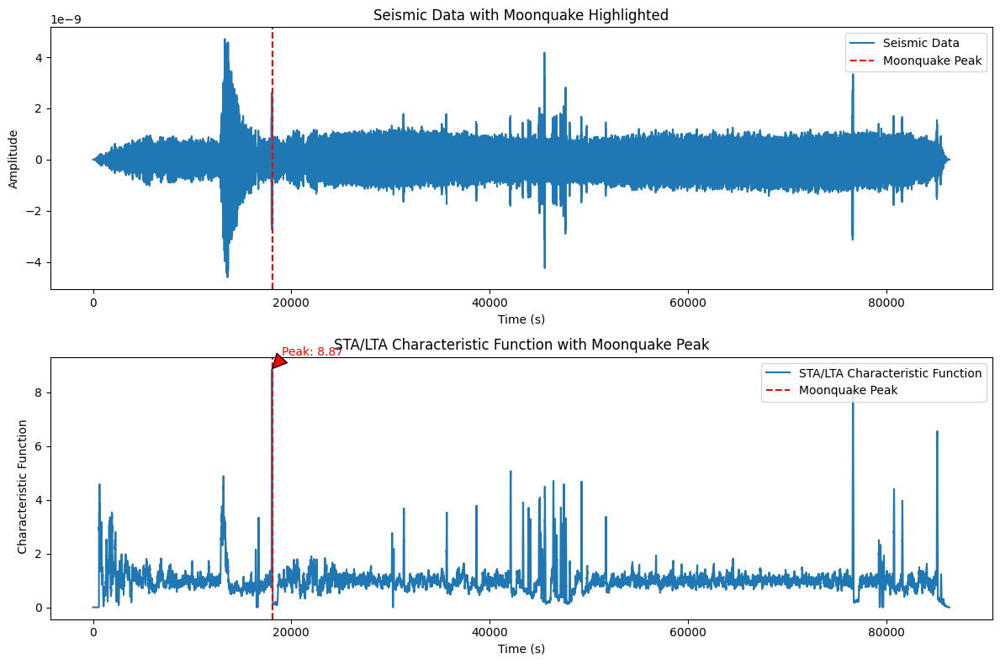

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import obspy
from obspy.signal.trigger import classic_sta_lta

# Load the seismic data
file_path = "/content/drive/MyDrive/space_apps_2024_seismic_detection/space_apps_2024_seismic_detection/data/lunar/training/data/S12_GradeA/xa.s12.00.mhz.1970-03-25HR00_evid00003.mseed"
stream = obspy.read(file_path)
trace = stream[0]

# Sampling rate and time vector
sampling_rate = trace.stats.sampling_rate
time = np.linspace(0, len(trace.data) / sampling_rate, num=len(trace.data))

# Short-term and long-term average window lengths (in seconds)
sta_window = 60  # Short-term window (e.g., 60 seconds)
lta_window = 600  # Long-term window (e.g., 600 seconds)

# Calculate STA/LTA characteristic function
sta_lta_cq = classic_sta_lta(trace.data, int(sta_window * sampling_rate), int(lta_window * sampling_rate))

# Time vector for the CQ function
cq_time = np.linspace(0, len(sta_lta_cq) / sampling_rate, num=len(sta_lta_cq))

# Find the highest amplitude moonquake
cq_peak_index = np.argmax(sta_lta_cq)  # Index of the highest CQ value
cq_peak_time = cq_time[cq_peak_index]  # Time of the highest CQ value
cq_peak_value = sta_lta_cq[cq_peak_index]  # Value of the highest CQ

# Plot the seismic data and highlight the highest moonquake
plt.figure(figsize=(12, 8))

# Plot seismic trace
plt.subplot(2, 1, 1)
plt.plot(time, trace.data, label="Seismic Data")
plt.axvline(x=cq_peak_time, color='red', linestyle='--', label="Moonquake Peak")
plt.title("Seismic Data with Moonquake Highlighted")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.legend(loc="upper right")

# Plot STA/LTA characteristic function
plt.subplot(2, 1, 2)
plt.plot(cq_time, sta_lta_cq, label="STA/LTA Characteristic Function")
plt.axvline(x=cq_peak_time, color='red', linestyle='--', label="Moonquake Peak")
plt.title("STA/LTA Characteristic Function with Moonquake Peak")
plt.xlabel("Time (s)")
plt.ylabel(" Characteristic Function")
plt.legend(loc="upper right")

# Annotate the peak value on the CQ plot
plt.annotate(f"Peak: {cq_peak_value:.2f}", xy=(cq_peak_time, cq_peak_value),
             xytext=(cq_peak_time + 1000, cq_peak_value + 0.5),
             arrowprops=dict(facecolor='red', shrink=0.05),
             fontsize=10, color="red")

# Show plots
plt.tight_layout()
plt.show()




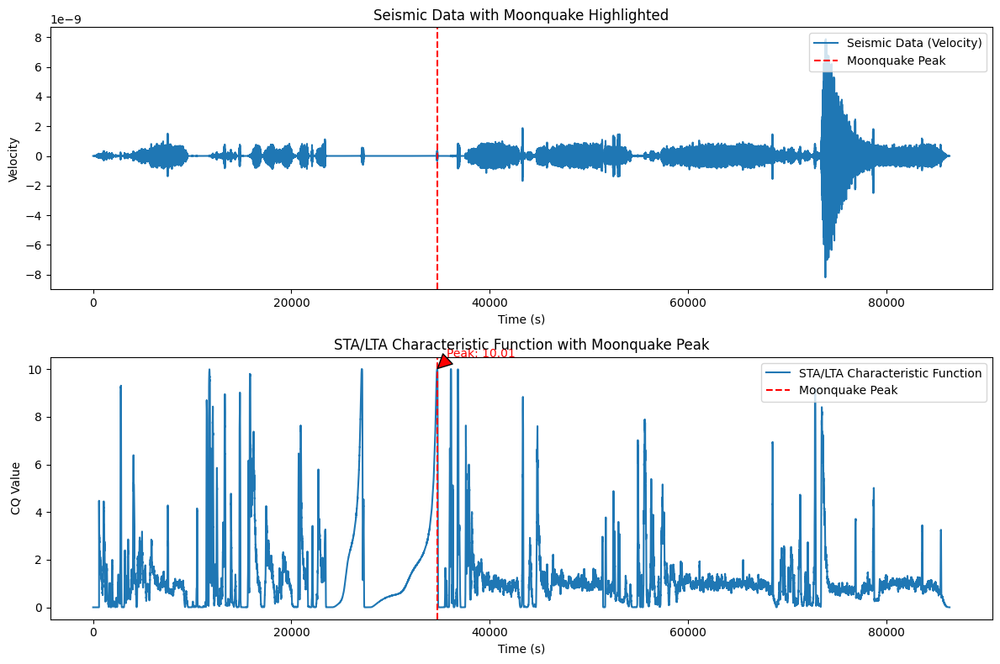

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from obspy.signal.trigger import classic_sta_lta

# Load the seismic data from the CSV file
file_path = "/content/drive/MyDrive/space_apps_2024_seismic_detection/space_apps_2024_seismic_detection/data/lunar/training/data/S12_GradeA/xa.s12.00.mhz.1970-01-19HR00_evid00002.csv"
df = pd.read_csv(file_path)

# Assuming the CSV contains a 'Time' column and an 'Amplitude' column
# Converting 'Amplitude' to 'Velocity'
time = df['time_rel(sec)'].values
velocity = df['velocity(m/s)'].values  # Use 'Amplitude' as the raw data

# Short-term and long-term average window lengths (in seconds)
sta_window = 60  # Short-term window (e.g., 60 seconds)
lta_window = 600  # Long-term window (e.g., 600 seconds)

# Sampling rate (calculated from time data)
sampling_rate = 1 / np.mean(np.diff(time))

# Calculate STA/LTA characteristic function
sta_lta_cq = classic_sta_lta(velocity, int(sta_window * sampling_rate), int(lta_window * sampling_rate))

# Time vector for the CQ function
cq_time = np.linspace(0, len(sta_lta_cq) / sampling_rate, num=len(sta_lta_cq))

# Find the highest amplitude moonquake
cq_peak_index = np.argmax(sta_lta_cq)  # Index of the highest CQ value
cq_peak_time = cq_time[cq_peak_index]  # Time of the highest CQ value
cq_peak_value = sta_lta_cq[cq_peak_index]  # Value of the highest CQ

# Plot the seismic data and highlight the highest moonquake
plt.figure(figsize=(12, 8))

# Plot seismic trace
plt.subplot(2, 1, 1)
plt.plot(time, velocity, label="Seismic Data (Velocity)")
plt.axvline(x=cq_peak_time, color='red', linestyle='--', label="Moonquake Peak")
plt.title("Seismic Data with Moonquake Highlighted")
plt.xlabel("Time (s)")
plt.ylabel("Velocity")
plt.legend(loc="upper right")

# Plot STA/LTA characteristic function
plt.subplot(2, 1, 2)
plt.plot(cq_time, sta_lta_cq, label="STA/LTA Characteristic Function")
plt.axvline(x=cq_peak_time, color='red', linestyle='--', label="Moonquake Peak")
plt.title("STA/LTA Characteristic Function with Moonquake Peak")
plt.xlabel("Time (s)")
plt.ylabel("CQ Value")
plt.legend(loc="upper right")

# Annotate the peak value on the CQ plot
plt.annotate(f"Peak: {cq_peak_value:.2f}", xy=(cq_peak_time, cq_peak_value),
             xytext=(cq_peak_time + 1000, cq_peak_value + 0.5),
             arrowprops=dict(facecolor='red', shrink=0.05),
             fontsize=10, color="red")

# Show plots
plt.tight_layout()
plt.show()


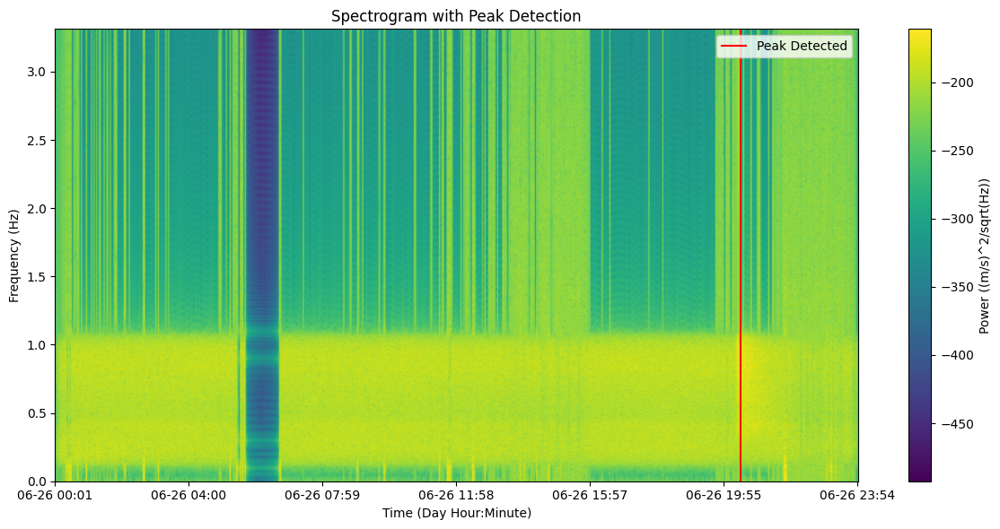

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import spectrogram
import pandas as pd

# Load the seismic data from the CSV file
file_path = "/content/drive/MyDrive/space_apps_2024_seismic_detection/space_apps_2024_seismic_detection/data/lunar/training/data/S12_GradeA/xa.s12.00.mhz.1970-03-26HR00_evid00004.csv"
df = pd.read_csv(file_path)

# Extract the relevant columns
time = df['time_rel(sec)'].values
amplitude = df['velocity(m/s)'].values  # Using 'velocity(m/s)' as the amplitude data

# Find the sampling rate
sampling_rate = 1 / np.mean(np.diff(time))

# Find the peak amplitude
peak_index = np.argmax(np.abs(amplitude))  # Index of the highest amplitude
peak_time = time[peak_index]  # Time of the highest amplitude
peak_value = amplitude[peak_index]  # Value of the highest amplitude

# Generate the spectrogram
frequencies, times, Sxx = spectrogram(amplitude, fs=sampling_rate, nperseg=1024)

# Convert times to formatted day/hour:minute
formatted_times = [pd.to_datetime('1975-06-26') + pd.to_timedelta(t, unit='s') for t in times]

# Plot the spectrogram with peak detection
plt.figure(figsize=(12, 6))

plt.pcolormesh(times, frequencies, 10 * np.log10(Sxx), shading='gouraud', cmap='viridis')
plt.colorbar(label="Power ((m/s)^2/sqrt(Hz))")
plt.axvline(x=peak_time, color='red', linestyle='-', label="Peak Detected")
plt.title("Spectrogram with Peak Detection")
plt.ylabel("Frequency (Hz)")
plt.xlabel("Time (Day Hour:Minute)")
plt.xticks(ticks=times[::len(times)//6], labels=[t.strftime('%m-%d %H:%M') for t in formatted_times[::len(times)//6]])
plt.legend(loc="upper right")

# Highlight the peak in the spectrogram
plt.tight_layout()
plt.show()


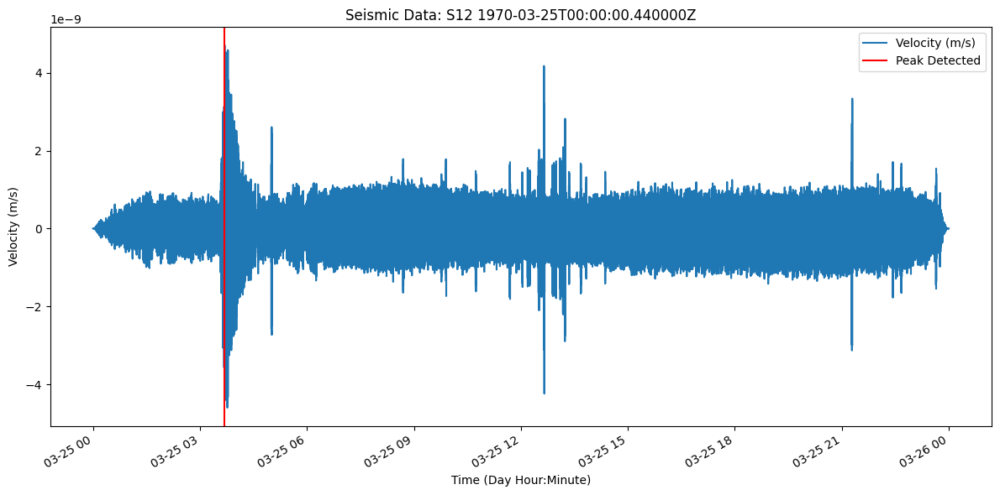

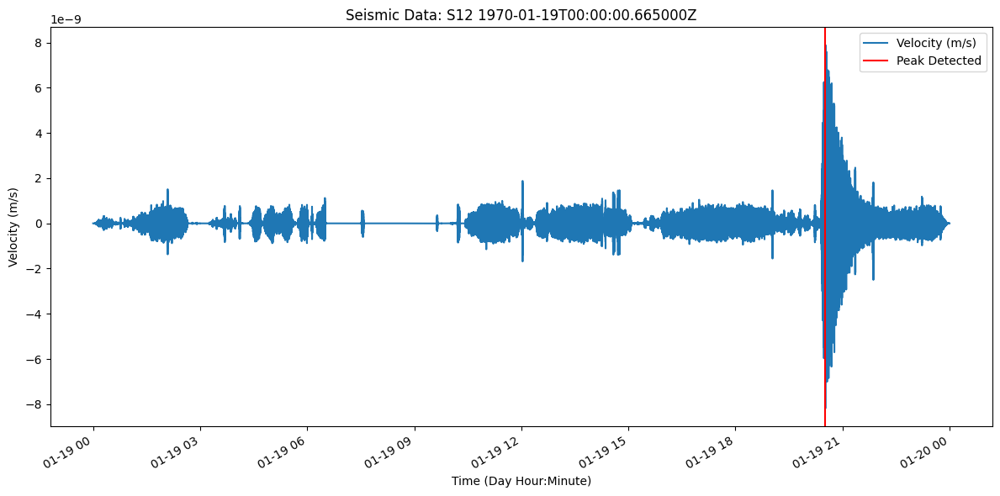

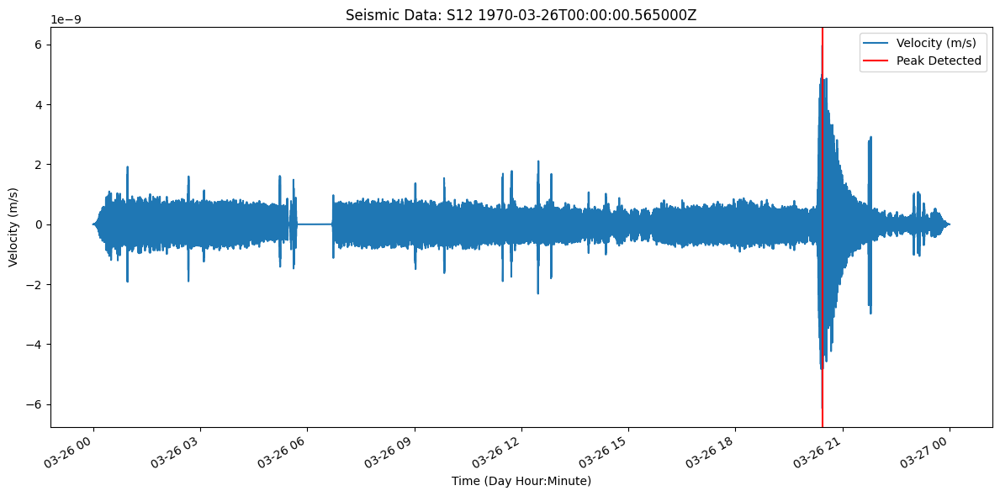

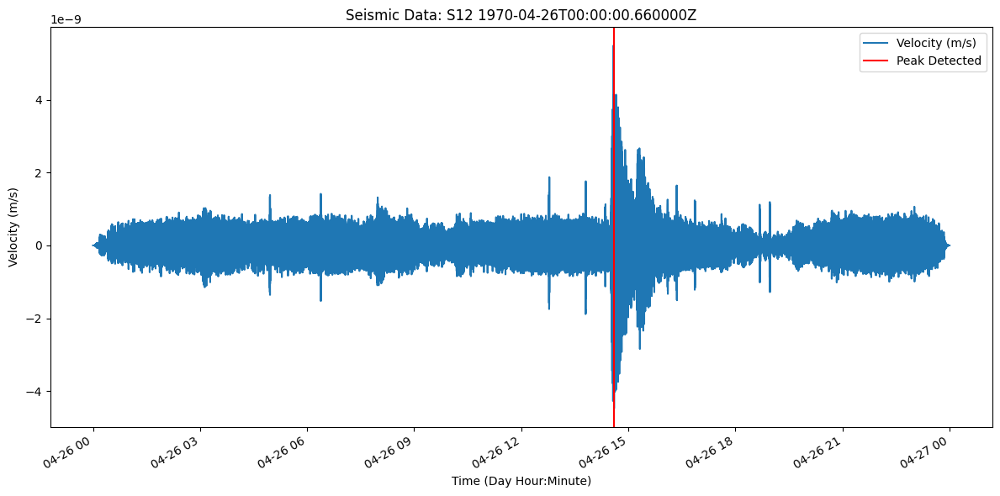

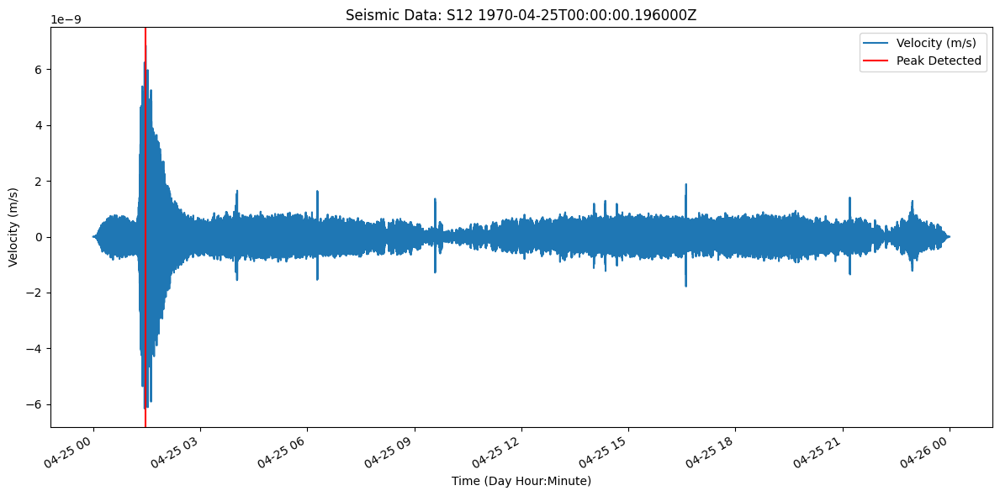

...

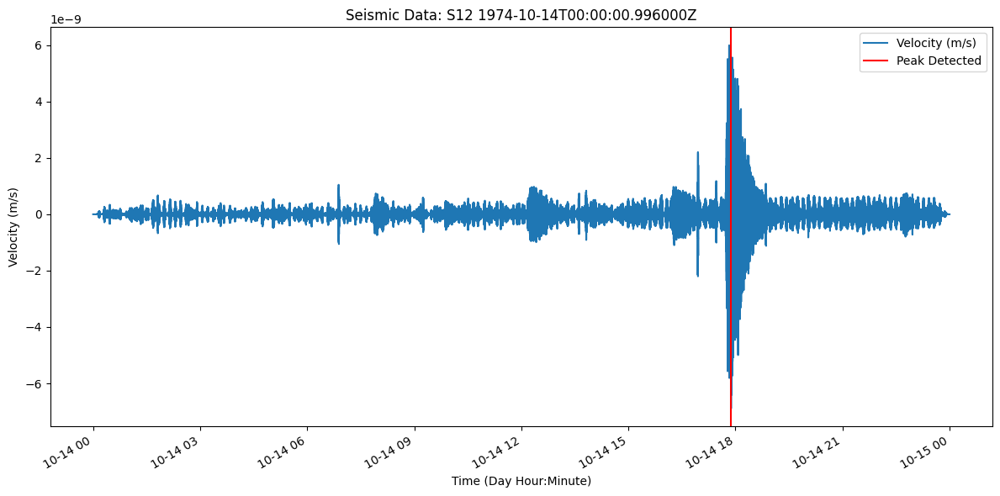

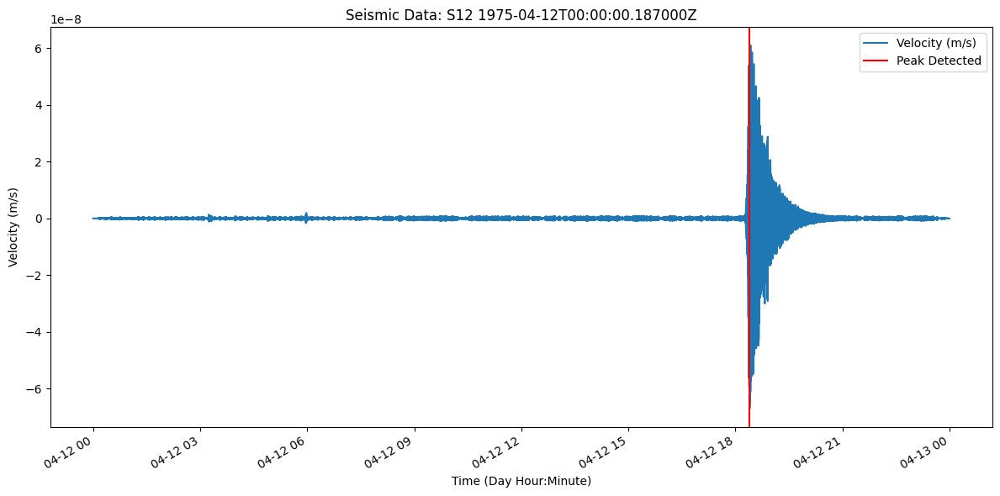

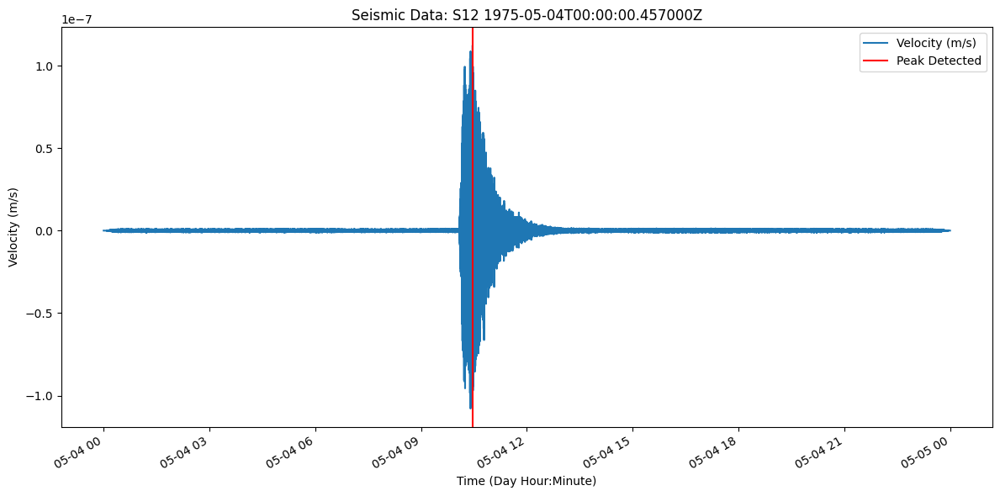

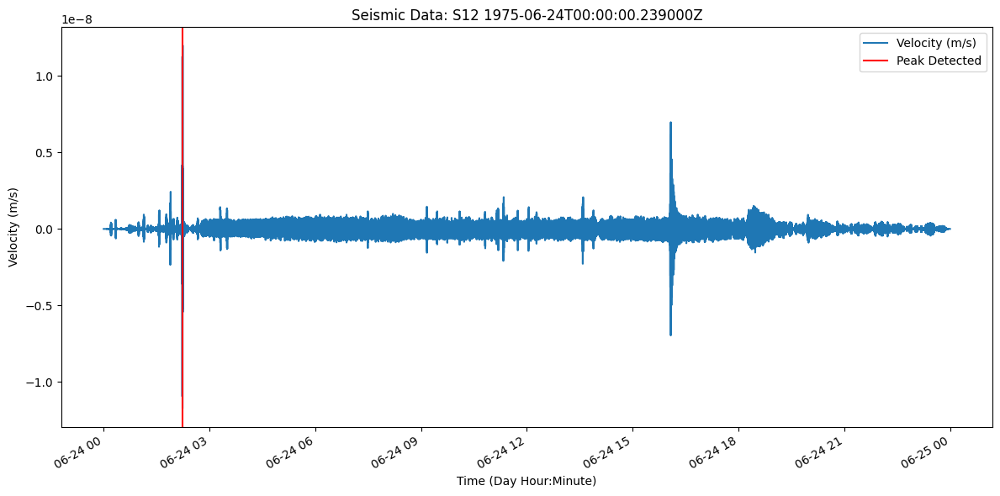

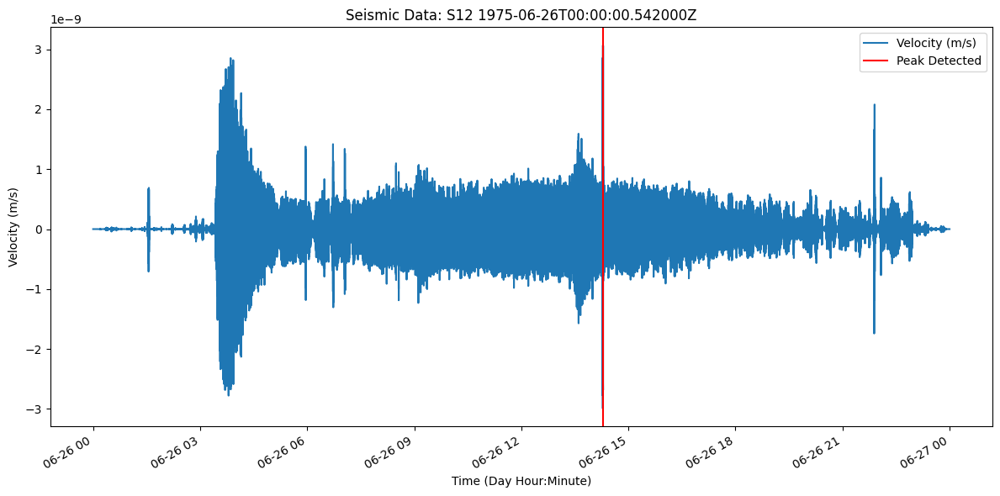

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import obspy
import pandas as pd
import glob

# Directory containing the .mseed files
directory_path = "/content/drive/MyDrive/space_apps_2024_seismic_detection/space_apps_2024_seismic_detection/data/lunar/training/data/S12_GradeA/*.mseed"

# Loop through each .mseed file in the directory
for file_path in glob.glob(directory_path):
    # Load the seismic data
    stream = obspy.read(file_path)
    trace = stream[0]

    # Extract time and velocity data
    sampling_rate = trace.stats.sampling_rate
    time = np.linspace(0, len(trace.data) / sampling_rate, num=len(trace.data))
    velocity = trace.data  # Velocity in m/s

    # Find the peak velocity
    peak_index = np.argmax(np.abs(velocity))  # Index of the highest amplitude
    peak_time = time[peak_index]  # Time of the highest amplitude
    peak_value = velocity[peak_index]  # Value of the highest amplitude

    # Convert time to formatted day/hour:minute
    start_datetime = trace.stats.starttime.datetime
    formatted_times = [start_datetime + pd.to_timedelta(t, unit='s') for t in time]

    # Plot the velocity with the detected peak
    plt.figure(figsize=(12, 6))
    plt.plot(formatted_times, velocity, label="Velocity (m/s)")
    plt.axvline(x=formatted_times[peak_index], color='red', linestyle='-', label="Peak Detected")
    plt.title(f"Seismic Data: {trace.stats.station} {trace.stats.starttime}")
    plt.xlabel("Time (Day Hour:Minute)")
    plt.ylabel("Velocity (m/s)")
    plt.legend(loc="upper right")

    # Format x-axis ticks dynamically
    plt.gcf().autofmt_xdate()

    # Highlight the peak value
    plt.tight_layout()
    plt.show()


In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import obspy
import pandas as pd
import glob

# Directory containing the .mseed files and output directory for plots
input_directory_path = "/content/drive/MyDrive/space_apps_2024_seismic_detection/space_apps_2024_seismic_detection/data/lunar/training/data/S12_GradeA/*.mseed"
output_directory_path = "/content/drive/MyDrive/space_apps_2024_seismic_detection/seismic_plots"

# Create the output directory if it doesn't exist
os.makedirs(output_directory_path, exist_ok=True)

# Loop through each .mseed file in the directory
for file_path in glob.glob(input_directory_path):
    # Extract the file name without extension
    file_name = os.path.splitext(os.path.basename(file_path))[0]

    # Load the seismic data
    stream = obspy.read(file_path)
    trace = stream[0]

    # Extract time and velocity data
    sampling_rate = trace.stats.sampling_rate
    time = np.linspace(0, len(trace.data) / sampling_rate, num=len(trace.data))
    velocity = trace.data  # Velocity in m/s

    # Find the peak velocity
    peak_index = np.argmax(np.abs(velocity))  # Index of the highest amplitude
    peak_time = time[peak_index]  # Time of the highest amplitude
    peak_value = velocity[peak_index]  # Value of the highest amplitude

    # Convert time to formatted day/hour:minute
    start_datetime = trace.stats.starttime.datetime
    formatted_times = [start_datetime + pd.to_timedelta(t, unit='s') for t in time]

    # Plot the velocity with the detected peak
    plt.figure(figsize=(12, 6))
    plt.plot(formatted_times, velocity, label="Velocity (m/s)")
    plt.axvline(x=formatted_times[peak_index], color='red', linestyle='-', label="Peak Detected")
    plt.title(f"Seismic Data: {trace.stats.station} {trace.stats.starttime}")
    plt.xlabel("Time (Day Hour:Minute)")
    plt.ylabel("Velocity (m/s)")
    plt.legend(loc="upper right")

    # Format x-axis ticks dynamically
    plt.gcf().autofmt_xdate()

    # Highlight the peak value
    plt.tight_layout()

    # Save the plot as an image file with the same name as the input file
    output_file_path = os.path.join(output_directory_path, f"{file_name}.png")
    plt.savefig(output_file_path)
    plt.close()

print(f"Plots have been saved to {output_directory_path}.")


Plots have been saved to /content/drive/MyDrive/space_apps_2024_seismic_detection/seismic_plots.


In [ ]:
import os
import pandas as pd

# Define the directory containing spectrograms
spectrogram_dir = '/content/drive/MyDrive/space_apps_2024_seismic_detection/seismic_plots'

# Load the catalog
catalog = pd.read_csv('/content/drive/MyDrive/space_apps_2024_seismic_detection/space_apps_2024_seismic_detection/data/lunar/training/catalogs/apollo12_catalog_GradeA_final.csv')

# Ensure catalog filenames have no extension and normalize (lowercase and strip)
catalog['file'] = catalog['filename'].str.strip().str.lower()  # Normalize catalog filenames (lowercase and remove spaces)

# List all spectrogram files in the directory and normalize filenames
spectrogram_files = [os.path.splitext(f)[0].strip().lower() for f in os.listdir(spectrogram_dir) if f.endswith('.png')]

# Create a mapping of filenames to labels
labels = []
for spectrogram in spectrogram_files:
    label_row = catalog[catalog['file'] == spectrogram]  # Match spectrogram filename to catalog
    if not label_row.empty:
        label = label_row['mq_type'].values[0]  # Replace with the correct column name for labels
        labels.append({'file': spectrogram + '.png', 'label': label})  # Add the extension back for the spectrogram file
    else:
        print(f"No label found for {spectrogram}")

# Save the labels to a CSV in Google Drive or any specific directory
output_csv_path = 'labeled_spectrograms.csv'
labels_df = pd.DataFrame(labels)
labels_df.to_csv(output_csv_path, index=False)

print(f"Labeling complete. Labeled spectrograms saved to: {output_csv_path}")

No label found for xa.s12.00.mhz.1971-04-13hr02_evid00029
Labeling complete. Labeled spectrograms saved to: labeled_spectrograms.csv


In [ ]:
from tensorflow.keras.layers import BatchNormalization

# Function to create a more complex CNN model
def create_complex_model():
    model = Sequential([
        # First convolutional block
        Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)),
        BatchNormalization(),
        MaxPooling2D(2, 2),
        Dropout(0.3),  # Dropout to prevent overfitting

        # Second convolutional block
        Conv2D(64, (3, 3), activation='relu'),
        BatchNormalization(),
        MaxPooling2D(2, 2),
        Dropout(0.3),

        # Third convolutional block
        Conv2D(128, (3, 3), activation='relu'),
        BatchNormalization(),
        MaxPooling2D(2, 2),
        Dropout(0.4),

        # Fourth convolutional block
        Conv2D(256, (3, 3), activation='relu'),
        BatchNormalization(),
        MaxPooling2D(2, 2),
        Dropout(0.4),

        # Flatten and dense layers
        Flatten(),
        Dense(256, activation='relu'),
        BatchNormalization(),
        Dropout(0.5),
        Dense(128, activation='relu'),
        BatchNormalization(),
        Dropout(0.5),

        # Output layer
        Dense(y_encoded.shape[1], activation='softmax')
    ])
    model.compile(optimizer=Adam(learning_rate=0.0001),  # Reduced learning rate for better convergence
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])
    return model

# Create the complex model
model = create_complex_model()

# Train the model
history = model.fit(
    X_train, y_train,
    validation_split=0.2,
    epochs=30,  # Increased number of epochs
    batch_size=32,  # Increased batch size
    verbose=1
)

# Evaluate the model on the test data
test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
print(f"Test Accuracy: {test_accuracy * 100:.2f}%")


Epoch 1/30
9/9 ━━━━━━━━━━━━━━━━━━━━ 81s 8s/step - accuracy: 0.3418 - loss: 2.0469 - val_accuracy: 0.0417 - val_loss: 1.1109
Epoch 2/30
9/9 ━━━━━━━━━━━━━━━━━━━━ 77s 8s/step - accuracy: 0.4215 - loss: 1.6474 - val_accuracy: 0.1806 - val_loss: 1.1136
Epoch 3/30
9/9 ━━━━━━━━━━━━━━━━━━━━ 81s 8s/step - accuracy: 0.3234 - loss: 1.9043 - val_accuracy: 0.1806 - val_loss: 1.1510
Epoch 4/30
9/9 ━━━━━━━━━━━━━━━━━━━━ 81s 7s/step - accuracy: 0.4126 - loss: 1.6923 - val_accuracy: 0.1806 - val_loss: 1.2794
Epoch 5/30
9/9 ━━━━━━━━━━━━━━━━━━━━ 71s 8s/step - accuracy: 0.3985 - loss: 1.5258 - val_accuracy: 0.1806 - val_loss: 1.3451
Epoch 6/30
9/9 ━━━━━━━━━━━━━━━━━━━━ 80s 8s/step - accuracy: 0.3534 - loss: 1.8616 - val_accuracy: 0.1806 - val_loss: 1.4986
Epoch 7/30
9/9 ━━━━━━━━━━━━━━━━━━━━ 87s 8s/step - accuracy: 0.4001 - loss: 1.5977 - val_accuracy: 0.1806 - val_loss: 1.3228
Epoch 8/30
9/9 ━━━━━━━━━━━━━━━━━━━━ 76s 8s/step - accuracy: 0.3381 - loss: 1.6734 - val_accuracy: 0.0417 - val_loss: 1.1283
Epoch 9/

In [ ]:
import os

# Directory containing the files
directory_path = "/content/drive/MyDrive/space_apps_2024_seismic_detection/seismic_plots"

# Loop through each file in the directory
for file_name in os.listdir(directory_path):
    # Check if the file name contains 'H' or 'R' and replace them with 'h' and 'r'
    if 'H' in file_name or 'R' in file_name:
        new_file_name = file_name.replace('H', 'h').replace('R', 'r')
        old_file_path = os.path.join(directory_path, file_name)
        new_file_path = os.path.join(directory_path, new_file_name)

        # Rename the file
        os.rename(old_file_path, new_file_path)

print("Files have been renamed successfully.")


Files have been renamed successfully.


In [ ]:
import os
import pandas as pd
import cv2
import numpy as np
from tqdm import tqdm

# Define directories
spectrogram_dir = '/content/drive/MyDrive/space_apps_2024_seismic_detection/seismic_plots'
output_dir = '/content/drive/MyDrive/space_apps_2024_seismic_detection/augmented_spectrograms'
os.makedirs(output_dir, exist_ok=True)

# Load the catalog
catalog = pd.read_csv('/content/drive/MyDrive/space_apps_2024_seismic_detection/space_apps_2024_seismic_detection/data/lunar/training/catalogs/apollo12_catalog_GradeA_final.csv')
catalog['file'] = catalog['filename'].str.strip().str.lower()  # Normalize catalog filenames

# List all spectrogram files in the directory
spectrogram_files = [f for f in os.listdir(spectrogram_dir) if f.endswith('.png')]

# Augmentation functions
def augment_image(image):
    aug_images = []
    # Rotation
    for angle in [90, 180, 270]:
        rotated = cv2.rotate(image, {90: cv2.ROTATE_90_CLOCKWISE, 180: cv2.ROTATE_180, 270: cv2.ROTATE_90_COUNTERCLOCKWISE}[angle])
        aug_images.append(rotated)
    # Flipping
    flipped = cv2.flip(image, 1)  # Horizontal flip
    aug_images.append(flipped)
    # Adding noise
    noise = np.random.normal(0, 10, image.shape).astype(np.uint8)
    noisy = cv2.add(image, noise)
    aug_images.append(noisy)
    return aug_images

# Augment images and label
labels = []
for file in tqdm(spectrogram_files, desc="Augmenting images"):
    file_base = os.path.splitext(file)[0].lower()
    # Load the image
    img_path = os.path.join(spectrogram_dir, file)
    image = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

    # Check if the file is in the catalog
    label_row = catalog[catalog['file'] == file_base]
    if label_row.empty:
        print(f"No label found for {file}")
        continue
    label = label_row['mq_type'].values[0]  # Replace 'mq_type' with the correct column name

    # Save original image with label
    labels.append({'file': file, 'label': label})

    # Perform augmentations
    aug_images = augment_image(image)
    for i, aug_image in enumerate(aug_images):
        aug_filename = f"{file_base}_aug_{i+1}.png"
        aug_filepath = os.path.join(output_dir, aug_filename)
        cv2.imwrite(aug_filepath, aug_image)  # Save augmented image
        labels.append({'file': aug_filename, 'label': label})

# Save labels to CSV
labels_df = pd.DataFrame(labels)
output_csv_path = os.path.join(output_dir, 'labeled_augmented_spectrograms.csv')
labels_df.to_csv(output_csv_path, index=False)

print(f"Augmentation and labeling complete. Data saved to: {output_csv_path}")


Augmenting images:  25%|██▌       | 19/76 [00:06<00:17,  3.22it/s]

No label found for xa.s12.00.mhz.1971-04-13hr02_evid00029.png


Augmenting images: 100%|██████████| 76/76 [00:24<00:00,  3.15it/s]

Augmentation and labeling complete. Data saved to: /content/drive/MyDrive/space_apps_2024_seismic_detection/augmented_spectrograms/labeled_augmented_spectrograms.csv


In [ ]:
import os
import shutil

# Define source directories
source_dirs = [
    '/content/drive/MyDrive/space_apps_2024_seismic_detection/seismic_plots',
    '/content/drive/MyDrive/space_apps_2024_seismic_detection/seismic_plots/augmented_spectrograms'
]

# Define the target directory
target_dir = '/content/drive/MyDrive/space_apps_2024_seismic_detection/combined_spectrograms'
os.makedirs(target_dir, exist_ok=True)  # Create the target directory if it doesn't exist

# Move files from source directories to the target directory
for source_dir in source_dirs:
    for file_name in os.listdir(source_dir):
        source_path = os.path.join(source_dir, file_name)
        target_path = os.path.join(target_dir, file_name)

        # Check if it's a file
        if os.path.isfile(source_path):
            # Handle duplicate files
            if os.path.exists(target_path):
                base_name, ext = os.path.splitext(file_name)
                duplicate_file = f"{base_name}_duplicate{ext}"
                target_path = os.path.join(target_dir, duplicate_file)

            # Move the file
            shutil.move(source_path, target_path)

print(f"All files have been moved to: {target_dir}")


All files have been moved to: /content/drive/MyDrive/space_apps_2024_seismic_detection/combined_spectrograms
